<a href="https://colab.research.google.com/github/Tambup/wirenet-again/blob/main/Shap_MalConv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
!pip install git+https://github.com/elastic/ember.git

  Cloning https://github.com/elastic/ember.git to /tmp/pip-req-build-klb47od6
  Running command git clone -q https://github.com/elastic/ember.git /tmp/pip-req-build-klb47od6
     |████████████████████████████████| 3.9 MB 8.1 MB/s 
  Created wheel for ember: filename=ember-0.1.0-py3-none-any.whl size=12685 sha256=7353e7ee346e35270ef2be2bddce769416016070b29724b318cf3a771e831a02
  Stored in directory: /tmp/pip-ephem-wheel-cache-htw9mow5/wheels/0d/0c/d5/8bf798260ec4c5ab76e1cd3aef7489cd84fe1a4284ef80108b
Successfully built ember


In [3]:
!pip install pickle5

     |████████████████████████████████| 132 kB 8.3 MB/s 
  Created wheel for pickle5: filename=pickle5-0.0.11-cp37-cp37m-linux_x86_64.whl size=219325 sha256=ab16a00e2317a423f7ca7328b96ca158cf6639b36954ae8da7856708c6e88451
  Stored in directory: /root/.cache/pip/wheels/7e/6a/00/67136a90d6aca437d806d1d3cedf98106e840c97a3e5188198
Successfully built pickle5


In [4]:
import ember
import lightgbm as lgb  # Gradient Boosting
import torch
import torch.nn.functional as F

In [5]:
prefix = '/content/drive/MyDrive/ember2018'
# prefix = '/content/drive/MyDrive/Progetto sicurezza informatica/'

In [6]:
X_train, y_train, X_test, y_test = ember.read_vectorized_features(f'{prefix}')

In [7]:
ember_columns = ['Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Byte Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'Entropy Histogram', 'String lenghts', 'avlenghts', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C SUM()', 'entropy H', 'how many paths', 'how many urls', 'how many registry', 'how many MZ', 'size', 'v_size', 'has_debug', 'exports', 'imports', 'has_relocations', 'has_resources', 'has_signature', 'has_tls', 'symbols', 'time_stamp', 'machine', 'machine', 'machine', 'machine', 'machine', 'machine', 'machine', 'machine', 'machine', 'machine', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'characteristics', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'subsystem', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'dll_characteristics', 'magic', 'magic', 'magic', 'magic', 'magic', 'magic', 'magic', 'magic', 'magic', 'magic', 'major_image_version', 'minor_image_version', 'major_linker_version', 'minor_linker_version', 'major_operating_system_version', 'minor_operating_system_version', 'major_subsystem_version', 'minor_subsystem_version', 'sizeof_code', 'sizeof_headers', 'sizeof_heap_commit', 'len(sections)', 'number of sections with nonzero size', 'number of sections with an empty name', 'number of RX', 'number of W', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, size (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, entropy (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'section name, virtual size (hashed)', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'lief_binary.section_from_offset(lief_binary.entrypoint).name', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'properties entry point', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports libraries NAME', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'data imports imports Import Entry es.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'Information about exported functions.', 'EXPORT_TABLE', 'EXPORT_TABLE', 'IMPORT_TABLE', 'IMPORT_TABLE', 'RESOURCE_TABLE', 'RESOURCE_TABLE', 'EXCEPTION_TABLE', 'EXCEPTION_TABLE', 'CERTIFICATE_TABLE', 'CERTIFICATE_TABLE', 'BASE_RELOCATION_TABLE', 'BASE_RELOCATION_TABLE', 'DEBUG', 'DEBUG', 'ARCHITECTURE', 'ARCHITECTURE', 'GLOBAL_PTR', 'GLOBAL_PTR', 'TLS_TABLE', 'TLS_TABLE', 'LOAD_CONFIG_TABLE', 'LOAD_CONFIG_TABLE', 'BOUND_IMPORT', 'BOUND_IMPORT', 'IAT', 'IAT', 'DELAY_IMPORT_DESCRIPTOR', 'DELAY_IMPORT_DESCRIPTOR', 'CLR_RUNTIME_HEADER', 'CLR_RUNTIME_HEADER']


"""
import csv

with open('/content/ember_columns.csv') as csvfile:    
	csvReader = csv.reader(csvfile)
  ember_columns = [row[0] for row in csvReader]       
print(ember_columns)
"""

"\nimport csv\n\nwith open('/content/ember_columns.csv') as csvfile:    \n\tcsvReader = csv.reader(csvfile)\n  ember_columns = [row[0] for row in csvReader]       \nprint(ember_columns)\n"

# Test shap

In [8]:
!pip install shap

     |████████████████████████████████| 356 kB 9.9 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491649 sha256=e3052f8bf4fd47ba43388b7e8eb83bafb162804d37b133fd082e247795c14eb2
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


In [9]:
import shap

In [10]:
import numpy as np
import pickle5

In [11]:
class MalConv_ForADV(torch.nn.Module):
  # trained to minimize cross-entropy loss
  # criterion = nn.CrossEntropyLoss()
  def __init__(self, out_size=2, channels=128, window_size=512, embd_size=8):
    super(MalConv_ForADV, self).__init__()
    self.embd = torch.nn.Embedding(257, embd_size, padding_idx=0)
    self.embd.requires_grad_(True)
    self.window_size = window_size

    self.conv_1 = torch.nn.Conv1d(embd_size, channels, window_size, stride=window_size, bias=True)
    self.conv_2 = torch.nn.Conv1d(embd_size, channels, window_size, stride=window_size, bias=True)

    self.pooling = torch.nn.AdaptiveMaxPool1d(1)

    self.fc_1 = torch.nn.Linear(channels, channels)
    self.fc_2 = torch.nn.Linear(channels, out_size)

  def forward(self, x):
    # print('Input:', x.shape)
    x = torch.transpose(x, -1, -2)
    # print('Post transpose:', x.shape)
    cnn_value = self.conv_1(x)
    gating_weight = torch.sigmoid(self.conv_2(x))
    # print('Post sigm cnn:', cnn_value.shape)
    # print('Post sigm gating_weight:', gating_weight.shape)
    x = cnn_value * gating_weight
    # print('Post xor:', x.shape)
    x = self.pooling(x)
    # print('Post pooling:', x.shape)

    # Flatten
    x = x.view(x.size(0), -1)
    # print('Post flatten:', x.shape)
    x = F.relu(self.fc_1(x))
    # print('Post ReLu fc1:', x.shape)
    x = self.fc_2(x)
    # print('Post fc2:', x.shape)

    return x

In [12]:
np.random.seed(seed=42)
random_indices = np.arange(0, X_train.shape[0])
np.random.shuffle(random_indices)
X_train_random = X_train[random_indices[:100]]

In [13]:
# Ember
# model = lgb.Booster(model_file=f"{prefix}/ember_model_2018.txt")
# model.params['objective'] = 'binary'

# NN malconv
########################################
model = MalConv_ForADV(channels=256, window_size=512, embd_size=8)
weights = torch.load(f'{prefix}/MalConv/malconv.checkpoint', map_location='cpu')
model.load_state_dict(weights['model_state_dict'])

torcione = None
for x in X_train_random:
  x = np.frombuffer(x, dtype=np.uint8)
  inp_adv = torch.from_numpy(np.copy(x))[np.newaxis, :]
  embd_x = model.embd(inp_adv.long()).detach()
  if torcione != None:
    torcione= torch.cat((torcione, embd_x), 0)
  else:
    torcione = torch.Tensor(embd_x)
########################################
explainer = shap.DeepExplainer(model, torcione)

In [ ]:
with open(f'{prefix}/Features/DarkTequila_original', 'rb') as handle:
  features_tequila = pickle5.load(handle)

x = np.frombuffer(features_tequila, dtype=np.uint8)
inp_adv = torch.from_numpy(np.copy(x))[np.newaxis, :]
embd_x = model.embd(inp_adv.long()).detach()

shap_values_tequila_original = explainer.shap_values(embd_x)
shap.initjs()
shap.force_plot(base_value=explainer.expected_value[0],
                shap_values=shap_values_tequila_original[0][0])

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


shap.plots.force is slow for many thousands of rows, try subsampling your data.


In [ ]:
np.asarray(f_tequila.tolist()).shape

In [ ]:
with open(f'{prefix}/Features/taquila-bad-classified', 'rb') as handle:
  features_tequila = pickle5.load(handle)

f_tequila = np.array(features_tequila).reshape((1,-1))
shap_values_tequila_bad = explainer.shap_values(f_tequila)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_tequila_bad[1], feature_names=ember_columns)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


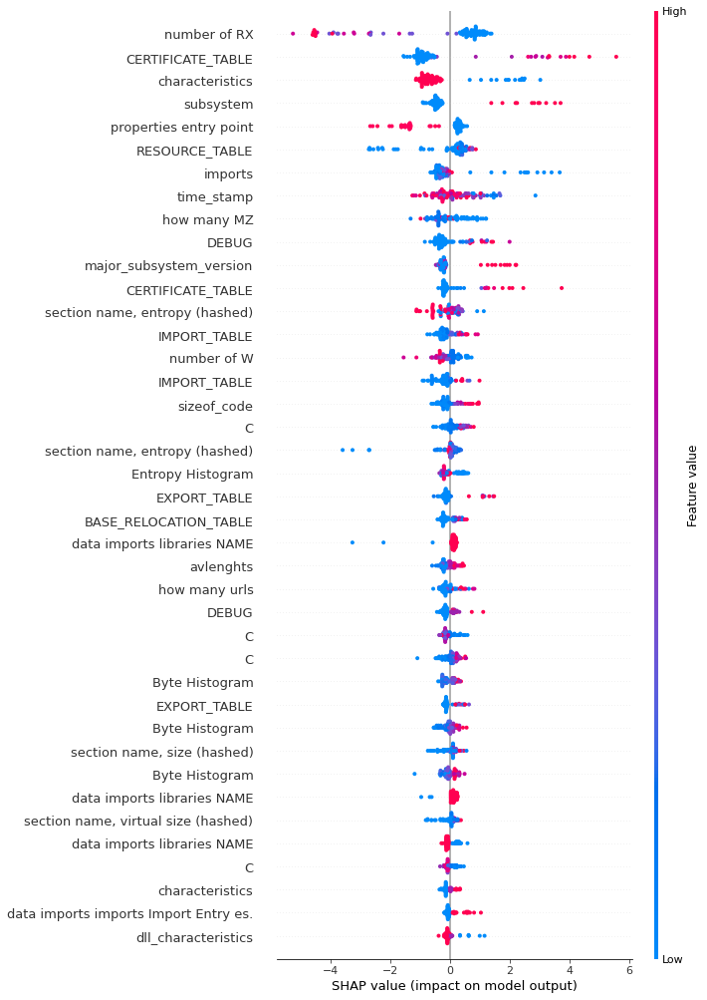

In [ ]:
shap.summary_plot(shap_values[0], np.asarray(X_test.tolist())[:100], max_display=40, sort=True, feature_names=ember_columns)

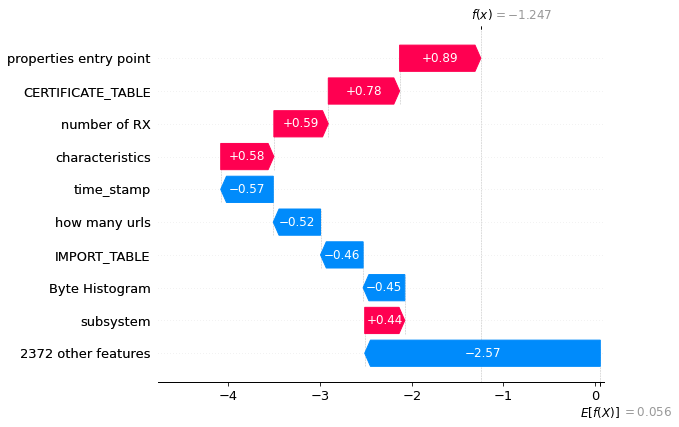

In [ ]:
shap.plots._waterfall.waterfall_legacy(explainer.expected_value[1], shap_values_tequila[1][0], feature_names=ember_columns, max_display=10)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0], feature_names=ember_columns)